In [30]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_excel('electronika_clean.xlsx')

In [31]:
df

,Unnamed: 0,Order_ID,Email_new,Phone_new,Source,OrderDate,время,месяц,ChangeDate,DeliveryDate,...,Quant,RowPrice,RowDiscount,RowSum,Brand,TN,TK,NomFullPath,Week,Nom_ID
0,10,1303000511_TT,556669108109_lm16@gmail.com,55574953-52525755535375,Онлайн-Резерв.,2016-03-01,10:46:45.000,201603,2016-03-05 09:16:49.000,2016-03-01 00:00:00.000,...,1,2970,0,2970,Ника,Товары для дома,Хозтовары,Техника для дома/Техника для ухода за одеждой/...,9,90364
1,12,1303000512_TT,556669108109_lm16@gmail.com,55574953-52525755535375,Онлайн-Резерв.,2016-03-01,10:47:19.000,201603,2016-03-01 10:59:43.000,2016-03-01 00:00:00.000,...,1,19490,0,19490,DeLonghi,Мелкая бытовая техника,Приготовление пищи,Техника для кухни/Приготовление пищи/Мультиварки/,9,45673
2,14,1303000513_TT,666668112117_pu19@ya.ru,55575655-50555350534877,Онлайн-Резерв.,2016-03-11,16:06:56.000,201603,2016-03-11 20:11:18.000,2016-03-12 00:00:00.000,...,1,19990,0,19990,Samsung,ТВ-Аудио,Телевизоры LCD,"Телевизоры, аудио, видео/Телевизоры/LED телеви...",10,120757
3,16,1303000514_TT,666668112117_pu19@ya.ru,55575653-57485657505272,Онлайн-Резерв.,2016-03-15,18:13:33.000,201603,2016-03-15 18:17:35.000,2016-03-22 00:00:00.000,...,1,23680,0,23680,СМК,Мебель,Мягкая мебель,Мебель/Мягкая мебель/Диваны/Трехместные диваны/,11,264580
4,28,1303000520_TT,56666668112117_pu26@yanded.ru,55575449-54535553535073,Онлайн-Резерв.,2016-03-01,00:01:46.000,201603,2016-03-04 15:09:38.000,2016-03-02 00:00:00.000,...,1,2420,0,2420,HP,Аксессуары,Картриджи и бумага,"Компьютеры, ноутбуки, планшеты/Оргтехника/Расх...",9,76102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183067,357019,5898089_BX,6666449117_1u9@bk.ru,55574957-51495048515075,Онлайн-Резерв.,2016-04-30,23:51:37.000,201604,2016-05-03 12:55:07.000,2016-05-02 00:00:00.000,...,1,899,0,899,Saturn,Климат,Вентиляторы бытовые,Техника для дома/Климатическая техника/Кондици...,17,38755
183068,357021,5898095_BX,666661118109_vm27@yahoo.com,55575452-55554849505278,Онлайн-Резерв.,2016-04-30,23:54:03.000,201604,2016-05-04 19:43:40.000,2016-05-07 00:00:00.000,...,1,1090,0,1090,Case Logic,Аксессуары,Аксессуары для фото/видео,Фото- и видеотехника/Аксессуары для фото и вид...,17,31908
183069,357023,5898099_BX,3110116_nt16@pisem.net,55574948-50554849554878,Онлайн-Резерв.,2016-04-30,23:56:02.000,201604,2016-05-01 11:57:42.000,2016-05-08 00:00:00.000,...,1,6859,0,6859,ELIKOR,Крупная бытовая техника,Встраиваемая техника,Встраиваемая техника/Вытяжки/,17,140459
183070,357024,5898102_BX,55666665102117_fu13@list.ru,55575648-51484956545071,Онлайн-Резерв.,2016-04-30,23:56:38.000,201604,2016-05-06 20:18:49.000,2016-05-05 00:00:00.000,...,1,9120,0,9120,FORWARD,Спорт и активный отдых,Велосипеды и аксессуары,Товары для спорта и отдыха/Велосипеды и аксесс...,17,295956


Text(0.5, 0, 'Дата')

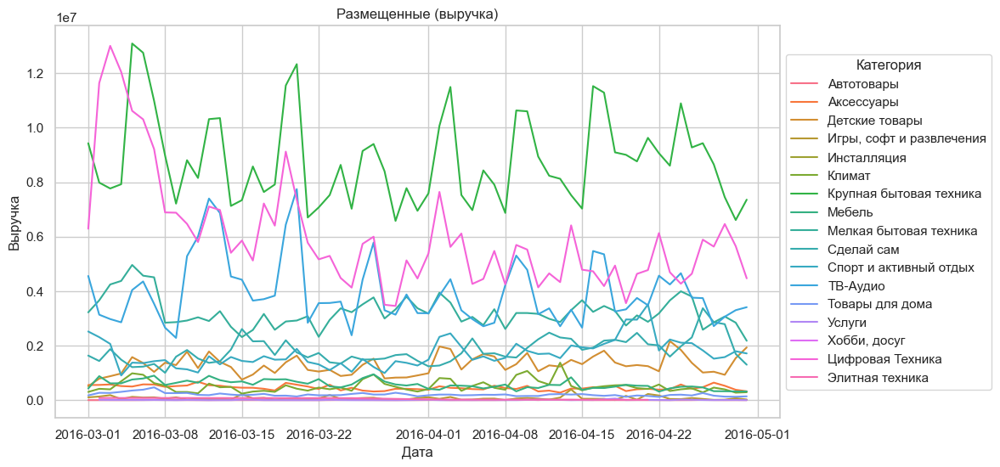

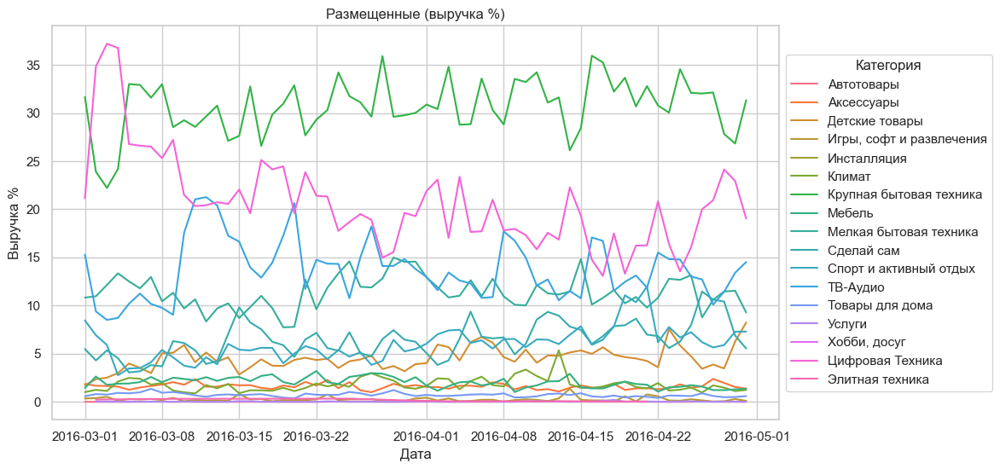

In [32]:
# Выручка размещенные

placed = df[['TN', 'OrderDate', 'RowSum']].groupby(['TN', 'OrderDate']).sum().reset_index()
placed['OrderDate'] = pd.to_datetime(placed['OrderDate'])
placed_total = df[['OrderDate', 'RowSum']].groupby('OrderDate').sum().reset_index()
placed_total['OrderDate'] = pd.to_datetime(placed_total['OrderDate'])
placed_joined = placed.merge(placed_total, on='OrderDate', suffixes=('', '_total'))
placed_joined['percent'] = 100.0 * placed_joined['RowSum'] / placed_joined['RowSum_total']

sns.set(style="whitegrid")
plt.figure(figsize=(11, 6))
sns.lineplot(data=placed, x='OrderDate', y='RowSum', hue='TN')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Категория")
plt.title('Размещенные (выручка)')
plt.ylabel('Выручка')
plt.xlabel('Дата')

sns.set(style="whitegrid")
plt.figure(figsize=(11, 6))
sns.lineplot(data=placed_joined, x='OrderDate', y='percent', hue='TN')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Категория")
plt.title('Размещенные (выручка %)')
plt.ylabel('Выручка %')
plt.xlabel('Дата')

Text(0.5, 0, 'Дата')

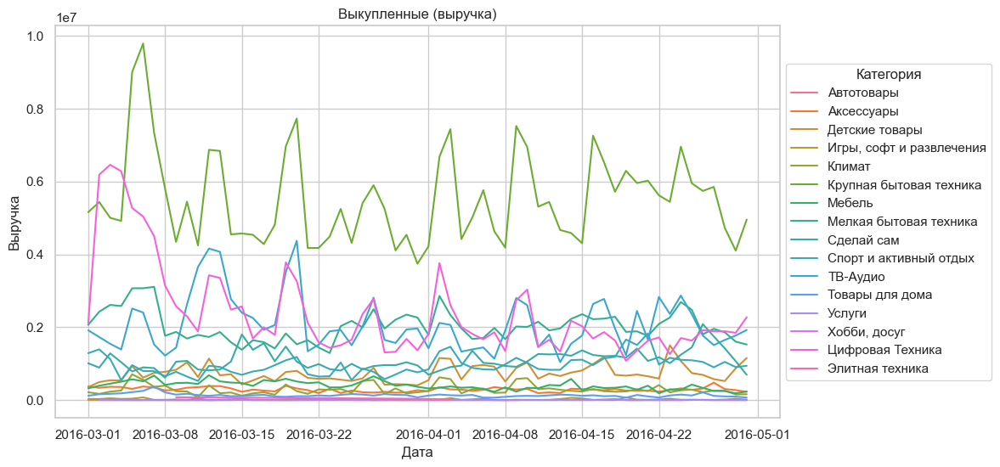

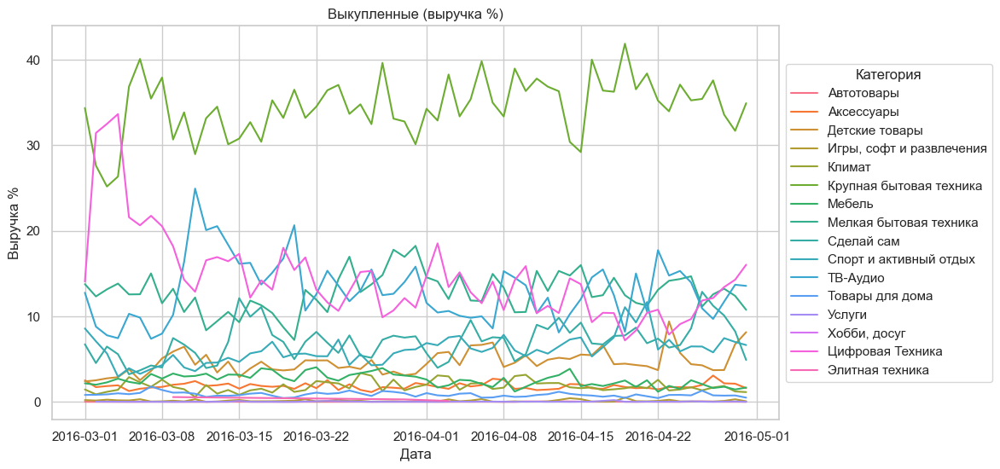

In [33]:
# Выручка выкупленные

sold = df[df['Status_ID'] == 14][['TN', 'OrderDate', 'RowSum']].groupby(['TN', 'OrderDate']).sum().reset_index()
sold['OrderDate'] = pd.to_datetime(sold['OrderDate'])
sold_total = df[df['Status_ID'] == 14][['OrderDate', 'RowSum']].groupby('OrderDate').sum().reset_index()
sold_total['OrderDate'] = pd.to_datetime(sold_total['OrderDate'])
sold_joined = sold.merge(sold_total, on='OrderDate', suffixes=('', '_total'))
sold_joined['percent'] = 100.0 * sold_joined['RowSum'] / sold_joined['RowSum_total']

sns.set(style="whitegrid")
plt.figure(figsize=(11, 6))
sns.lineplot(data=sold, x='OrderDate', y='RowSum', hue='TN')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Категория")
plt.title('Выкупленные (выручка)')
plt.ylabel('Выручка')
plt.xlabel('Дата')

sns.set(style="whitegrid")
plt.figure(figsize=(11, 6))
sns.lineplot(data=sold_joined, x='OrderDate', y='percent', hue='TN')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Категория")
plt.title('Выкупленные (выручка %)')
plt.ylabel('Выручка %')
plt.xlabel('Дата')

In [34]:
df1 = df

actions_values = df1['Actions'].value_counts().index
actions_set = set()
for action in actions_values:
    values = action.split(',')
    for value in values:
        actions_set.add(value)

for col in list(actions_set):
    df1[col] = df1['Actions'].apply(lambda x: int(str(x).find(col) != -1))
df1

,Unnamed: 0,Order_ID,Email_new,Phone_new,Source,OrderDate,время,месяц,ChangeDate,DeliveryDate,...,NomFullPath,Week,Nom_ID,БесплатнаяДоставкаНаСуммуКорзины,СкидкаНаТоварПоПромоСлову,СкидкаДляСпособаОплаты,НайдёшьДешевле,СкидкаНаКомплект,Подарки,СкидкаСуммойПроцентомСЛимитом
0,10,1303000511_TT,556669108109_lm16@gmail.com,55574953-52525755535375,Онлайн-Резерв.,2016-03-01,10:46:45.000,201603,2016-03-05 09:16:49.000,2016-03-01 00:00:00.000,...,Техника для дома/Техника для ухода за одеждой/...,9,90364,0,0,0,0,0,0,0
1,12,1303000512_TT,556669108109_lm16@gmail.com,55574953-52525755535375,Онлайн-Резерв.,2016-03-01,10:47:19.000,201603,2016-03-01 10:59:43.000,2016-03-01 00:00:00.000,...,Техника для кухни/Приготовление пищи/Мультиварки/,9,45673,0,0,0,0,0,0,0
2,14,1303000513_TT,666668112117_pu19@ya.ru,55575655-50555350534877,Онлайн-Резерв.,2016-03-11,16:06:56.000,201603,2016-03-11 20:11:18.000,2016-03-12 00:00:00.000,...,"Телевизоры, аудио, видео/Телевизоры/LED телеви...",10,120757,1,0,0,0,0,0,0
3,16,1303000514_TT,666668112117_pu19@ya.ru,55575653-57485657505272,Онлайн-Резерв.,2016-03-15,18:13:33.000,201603,2016-03-15 18:17:35.000,2016-03-22 00:00:00.000,...,Мебель/Мягкая мебель/Диваны/Трехместные диваны/,11,264580,1,0,0,0,0,0,0
4,28,1303000520_TT,56666668112117_pu26@yanded.ru,55575449-54535553535073,Онлайн-Резерв.,2016-03-01,00:01:46.000,201603,2016-03-04 15:09:38.000,2016-03-02 00:00:00.000,...,"Компьютеры, ноутбуки, планшеты/Оргтехника/Расх...",9,76102,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183067,357019,5898089_BX,6666449117_1u9@bk.ru,55574957-51495048515075,Онлайн-Резерв.,2016-04-30,23:51:37.000,201604,2016-05-03 12:55:07.000,2016-05-02 00:00:00.000,...,Техника для дома/Климатическая техника/Кондици...,17,38755,0,0,0,0,0,0,0
183068,357021,5898095_BX,666661118109_vm27@yahoo.com,55575452-55554849505278,Онлайн-Резерв.,2016-04-30,23:54:03.000,201604,2016-05-04 19:43:40.000,2016-05-07 00:00:00.000,...,Фото- и видеотехника/Аксессуары для фото и вид...,17,31908,0,0,0,0,0,0,0
183069,357023,5898099_BX,3110116_nt16@pisem.net,55574948-50554849554878,Онлайн-Резерв.,2016-04-30,23:56:02.000,201604,2016-05-01 11:57:42.000,2016-05-08 00:00:00.000,...,Встраиваемая техника/Вытяжки/,17,140459,1,0,0,0,0,0,0
183070,357024,5898102_BX,55666665102117_fu13@list.ru,55575648-51484956545071,Онлайн-Резерв.,2016-04-30,23:56:38.000,201604,2016-05-06 20:18:49.000,2016-05-05 00:00:00.000,...,Товары для спорта и отдыха/Велосипеды и аксесс...,17,295956,0,0,0,0,0,0,0


/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/4124925428.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stat.rename(columns={col: 'sales', f'{col}_percent': 'percent'}, inplace=True)
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/4124925428.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stat['type'] = col
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/4124925428.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: 

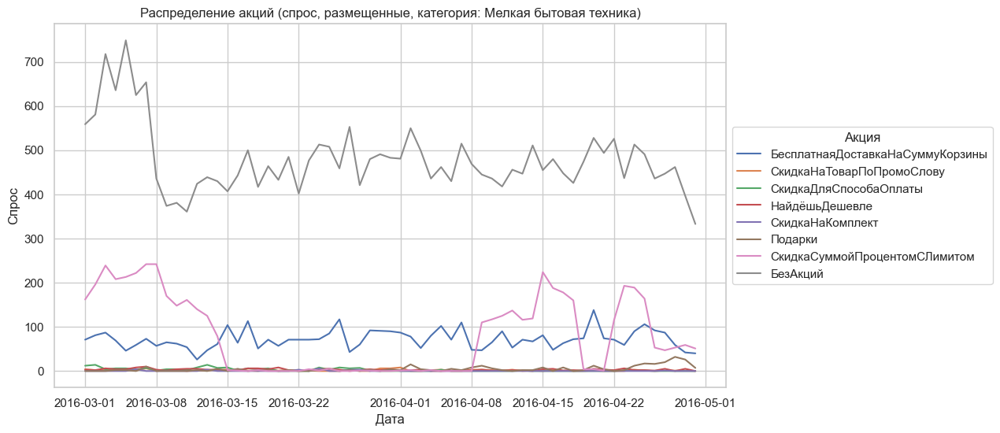

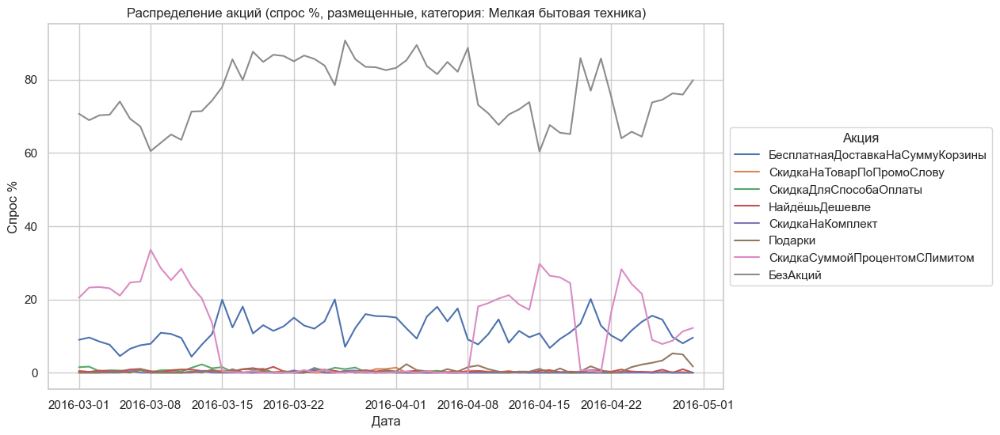

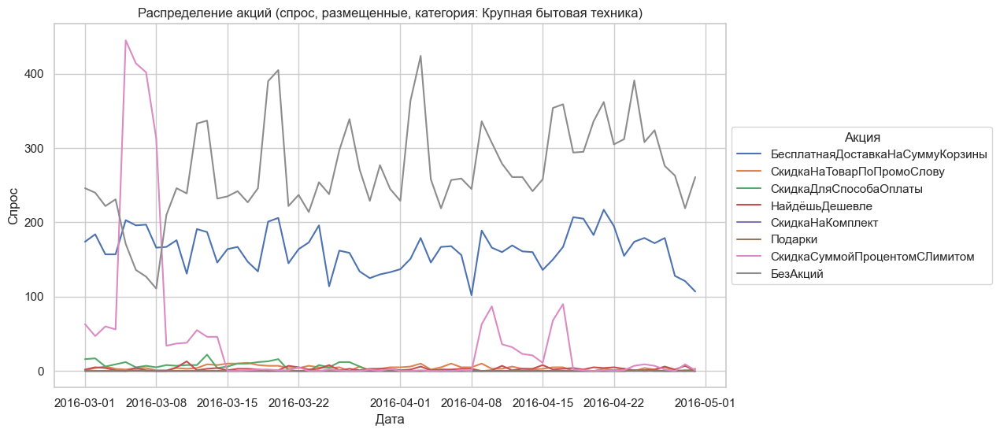

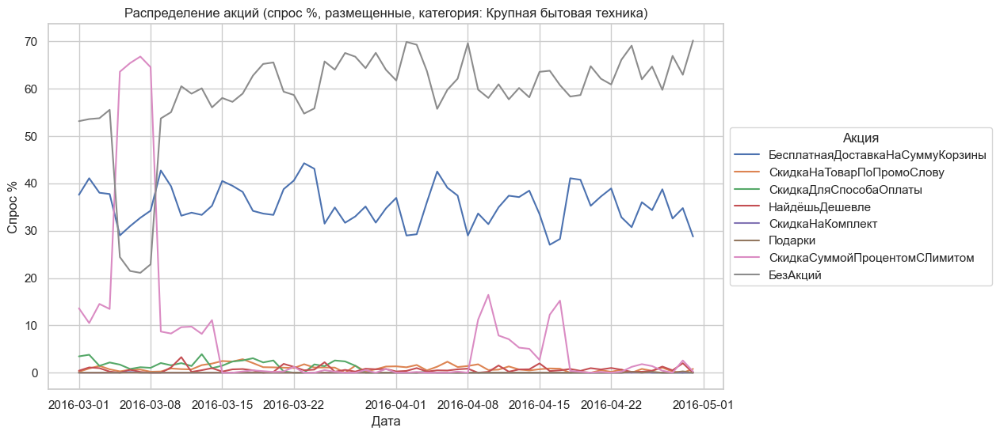

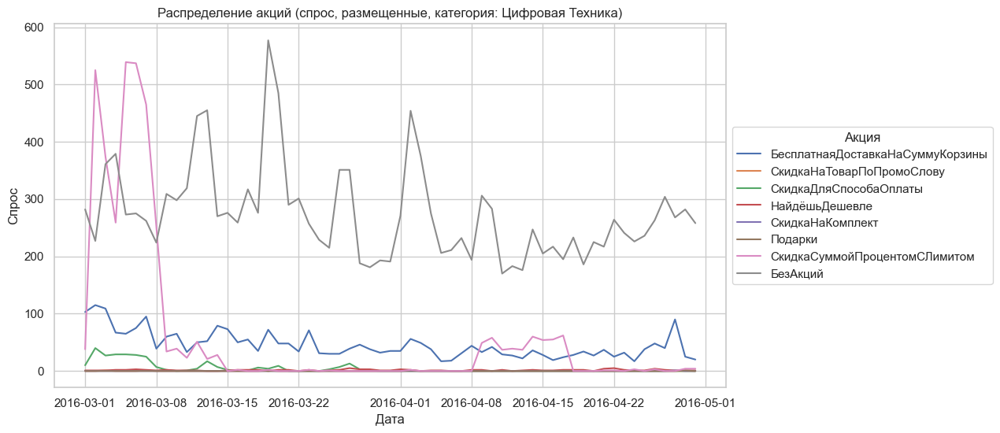

...

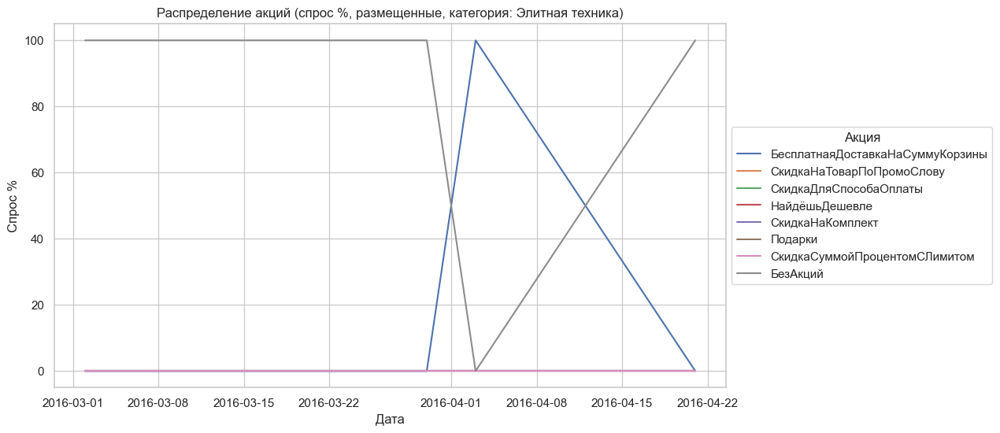

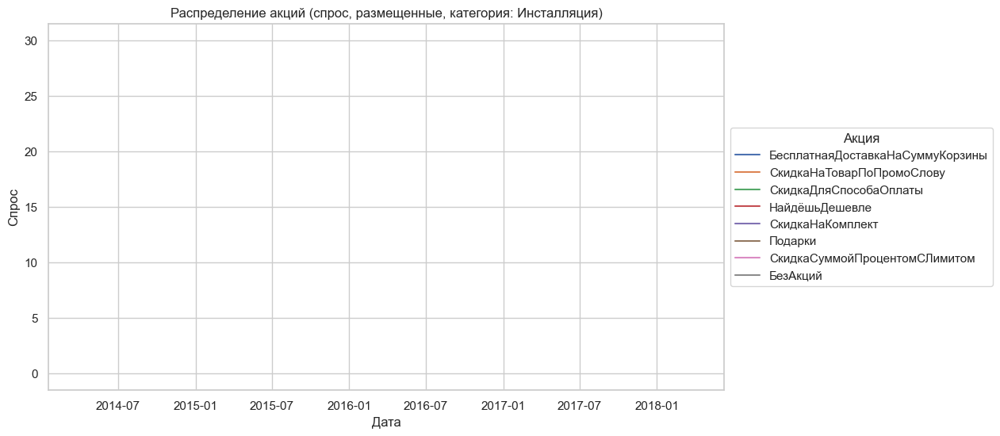

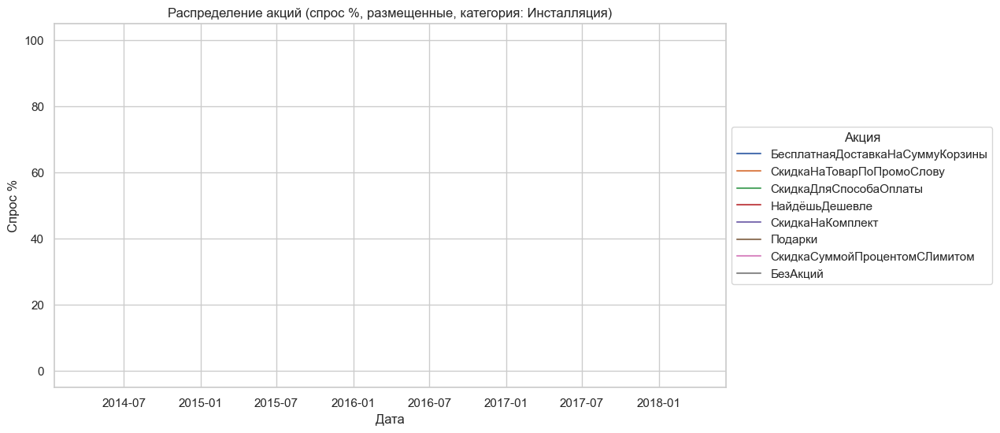

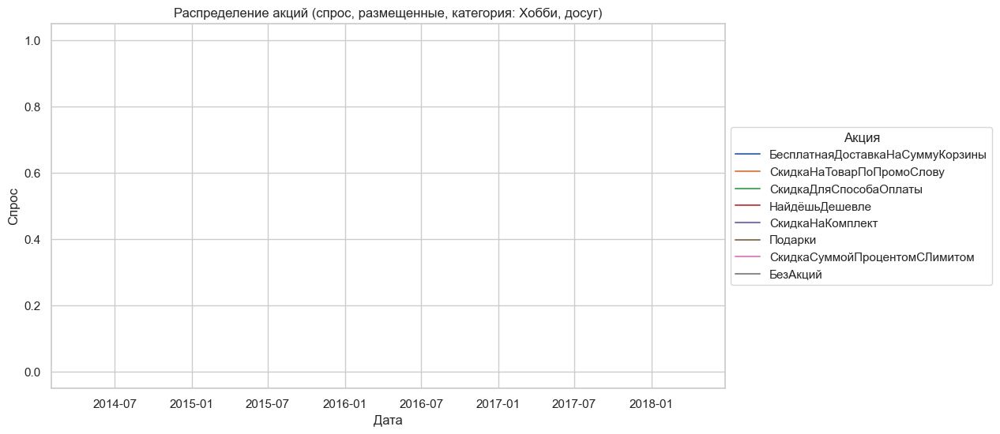

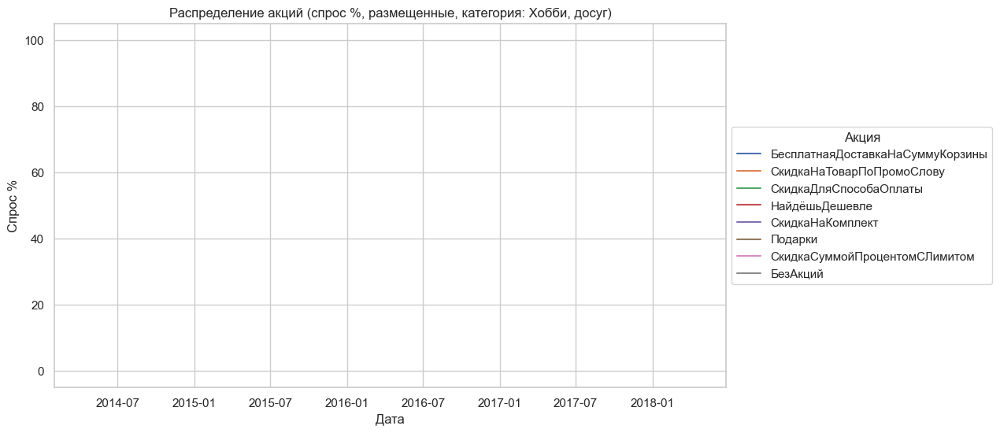

In [35]:
# Спрос размещенные

action_list = list(actions_set)
TNs = list(df['TN'].value_counts().index)

for category_name in TNs:
    category1 = df[df['TN'] == category_name]
    total = category1[['OrderDate', 'Quant']].groupby('OrderDate').sum()

    dfs = []

    for col in action_list:
        stat = pd.DataFrame()
        stat['OrderDate'] = category1['OrderDate']
        stat[col] = category1[col] * category1['Quant']
        dfs.append(stat.groupby('OrderDate').sum())

    stat = pd.DataFrame()
    stat['OrderDate'] = category1['OrderDate']
    stat['БезАкций'] = category1['Quant'] * (1 - category1[action_list[0]]) * (1 - category1[action_list[1]]) * (1 - category1[action_list[2]]) * (1 - category1[action_list[3]]) * (1 - category1[action_list[4]]) * (1 - category1[action_list[5]]) * (1 - category1[action_list[6]])
    dfs.append(stat.groupby('OrderDate').sum())

    joined = total.copy()
    for df2 in dfs:
        joined = joined.join(df2)

    for col in joined.columns:
        if col == 'Quant':
            continue
        joined[f'{col}_percent'] = 100.0 * joined[col] / joined['Quant']

    concatenated = pd.DataFrame()

    for col in joined.columns:
        if col == 'Quant':
            continue
        if not col.endswith('_percent'):
            stat = joined[[col, f'{col}_percent']]
            stat.rename(columns={col: 'sales', f'{col}_percent': 'percent'}, inplace=True)
            stat['type'] = col
            concatenated = pd.concat([concatenated, stat])

    concatenated = concatenated.reset_index()

    plt.figure(figsize=(11, 6))
    sns.lineplot(data=concatenated, x='OrderDate', y='sales', hue='type')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Акция")
    plt.title(f'Распределение акций (спрос, размещенные, категория: {category_name})')
    plt.ylabel('Спрос')
    plt.xlabel('Дата')

    plt.figure(figsize=(11, 6))
    sns.lineplot(data=concatenated, x='OrderDate', y='percent', hue='type')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Акция")
    plt.title(f'Распределение акций (спрос %, размещенные, категория: {category_name})')
    plt.ylabel('Спрос %')
    plt.xlabel('Дата')

/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/1267876907.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  category1 = df[df['Status_ID'] == 14][df['TN'] == category_name]
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/1267876907.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stat.rename(columns={col: 'sales', f'{col}_percent': 'percent'}, inplace=True)
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/1267876907.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stat['t

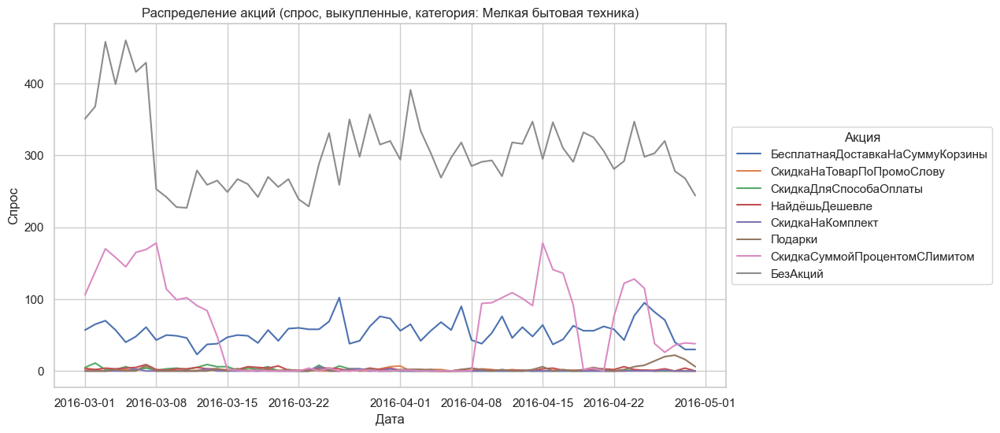

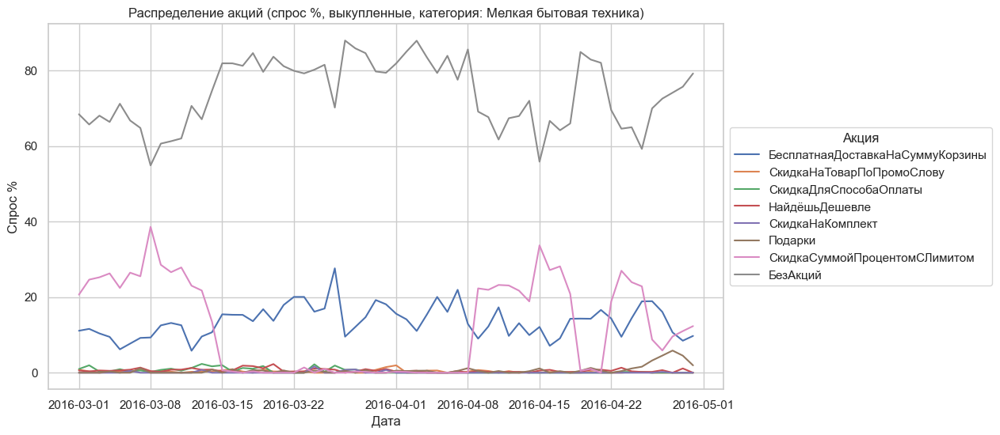

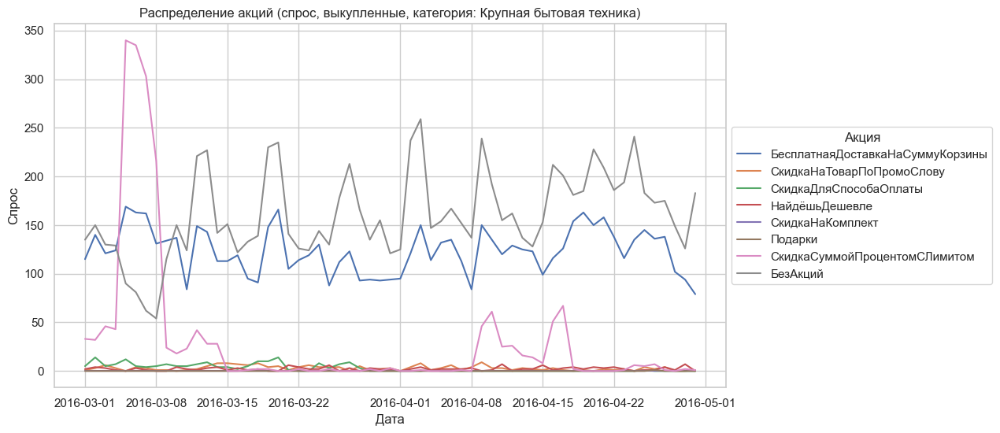

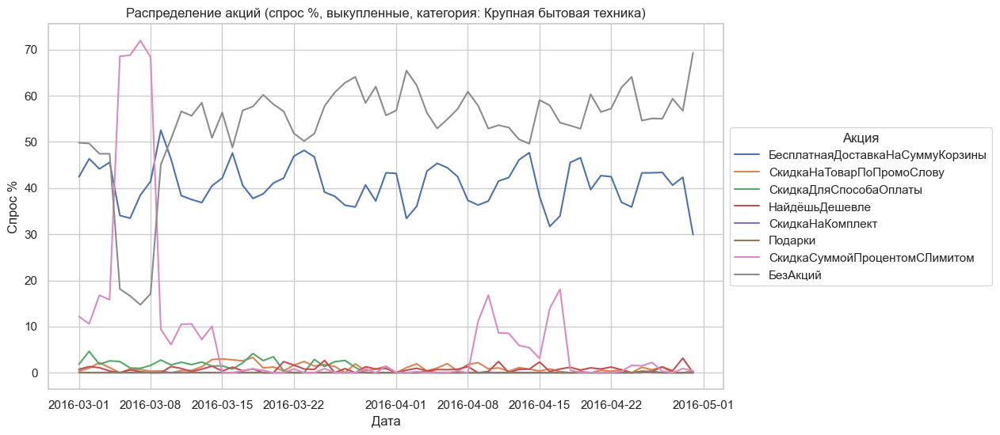

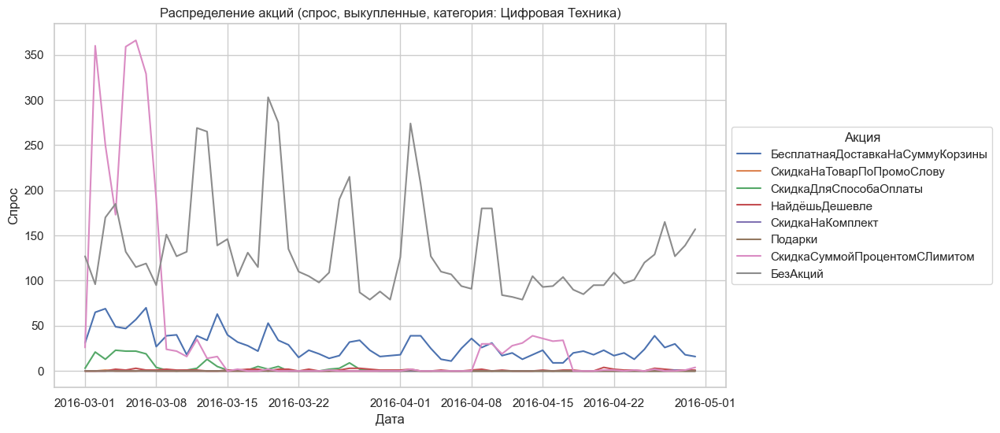

...

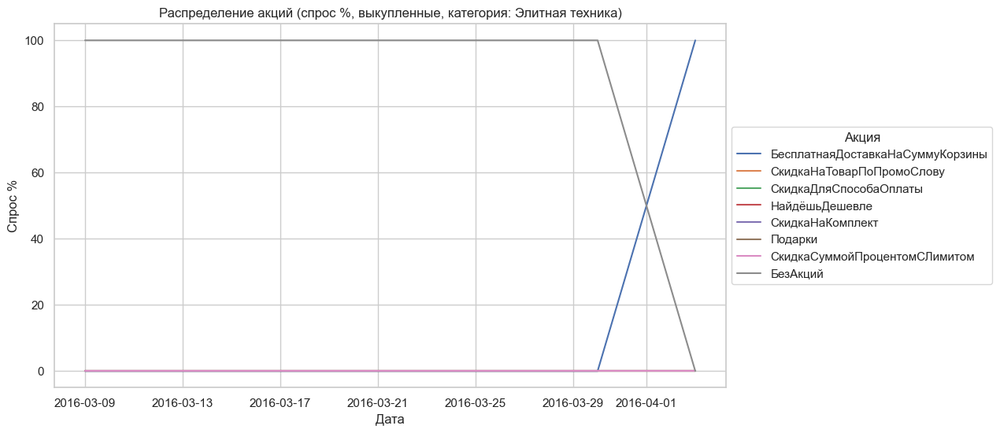

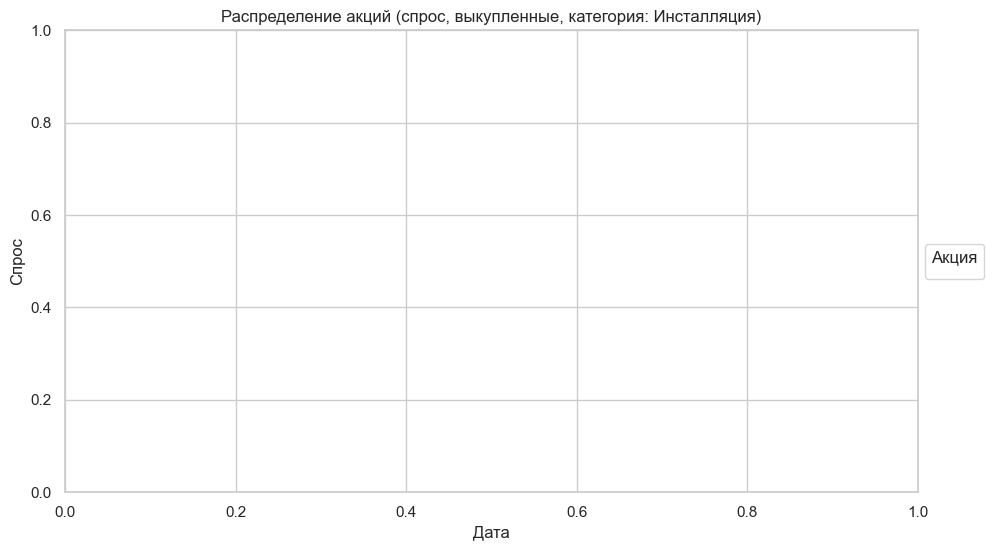

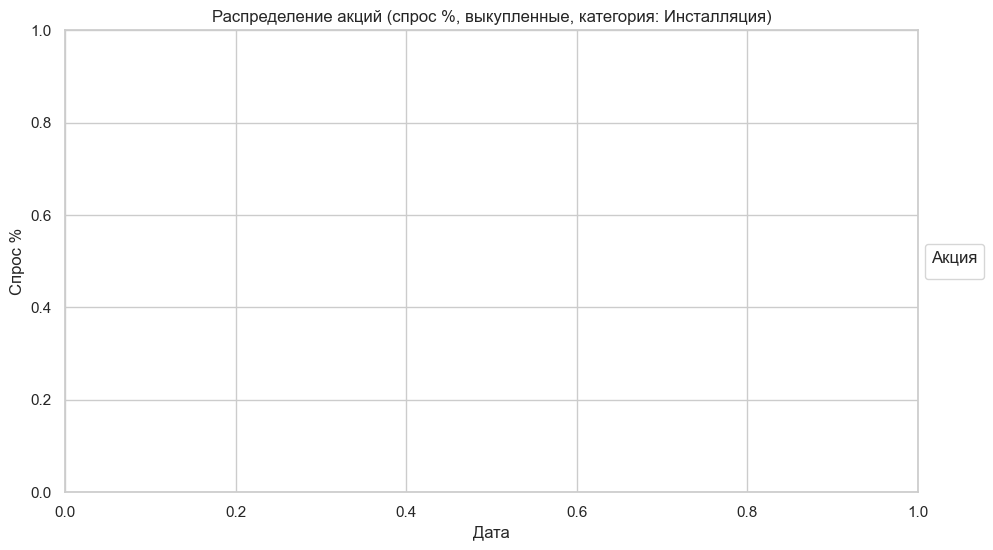

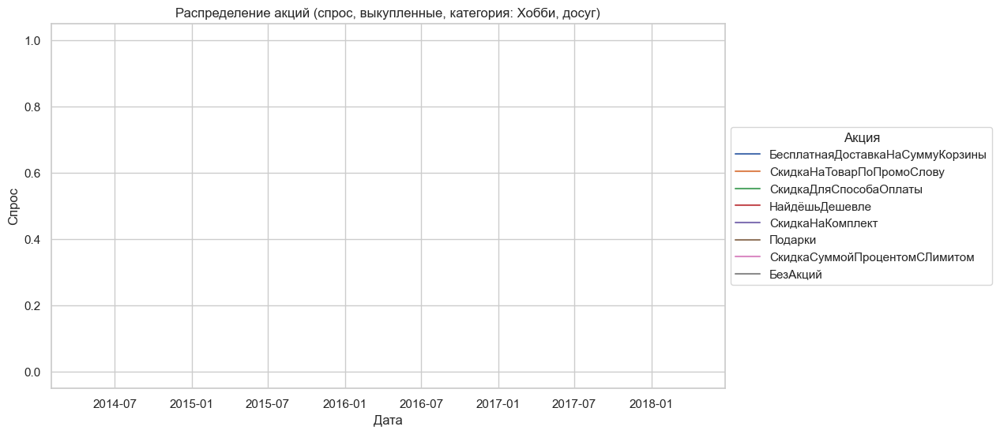

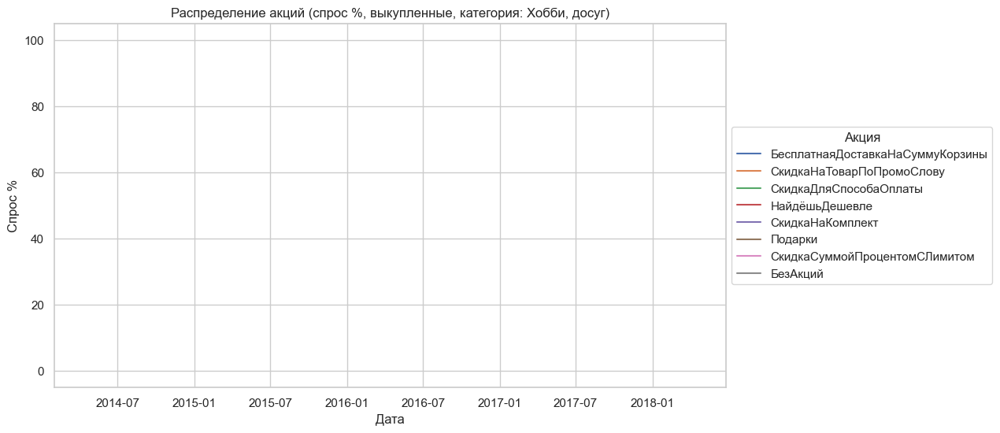

In [36]:
# Спрос выкупленные

action_list = list(actions_set)
TNs = list(df['TN'].value_counts().index)

for category_name in TNs:
    category1 = df[df['Status_ID'] == 14][df['TN'] == category_name]
    total = category1[['OrderDate', 'Quant']].groupby('OrderDate').sum()

    dfs = []

    for col in action_list:
        stat = pd.DataFrame()
        stat['OrderDate'] = category1['OrderDate']
        stat[col] = category1[col] * category1['Quant']
        dfs.append(stat.groupby('OrderDate').sum())

    stat = pd.DataFrame()
    stat['OrderDate'] = category1['OrderDate']
    stat['БезАкций'] = category1['Quant'] * (1 - category1[action_list[0]]) * (1 - category1[action_list[1]]) * (1 - category1[action_list[2]]) * (1 - category1[action_list[3]]) * (1 - category1[action_list[4]]) * (1 - category1[action_list[5]]) * (1 - category1[action_list[6]])
    dfs.append(stat.groupby('OrderDate').sum())

    joined = total.copy()
    for df2 in dfs:
        joined = joined.join(df2)

    for col in joined.columns:
        if col == 'Quant':
            continue
        joined[f'{col}_percent'] = 100.0 * joined[col] / joined['Quant']

    concatenated = pd.DataFrame()

    for col in joined.columns:
        if col == 'Quant':
            continue
        if not col.endswith('_percent'):
            stat = joined[[col, f'{col}_percent']]
            stat.rename(columns={col: 'sales', f'{col}_percent': 'percent'}, inplace=True)
            stat['type'] = col
            concatenated = pd.concat([concatenated, stat])

    concatenated = concatenated.reset_index()

    plt.figure(figsize=(11, 6))
    sns.lineplot(data=concatenated, x='OrderDate', y='sales', hue='type')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Акция")
    plt.title(f'Распределение акций (спрос, выкупленные, категория: {category_name})')
    plt.ylabel('Спрос')
    plt.xlabel('Дата')

    plt.figure(figsize=(11, 6))
    sns.lineplot(data=concatenated, x='OrderDate', y='percent', hue='type')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Акция")
    plt.title(f'Распределение акций (спрос %, выкупленные, категория: {category_name})')
    plt.ylabel('Спрос %')
    plt.xlabel('Дата')

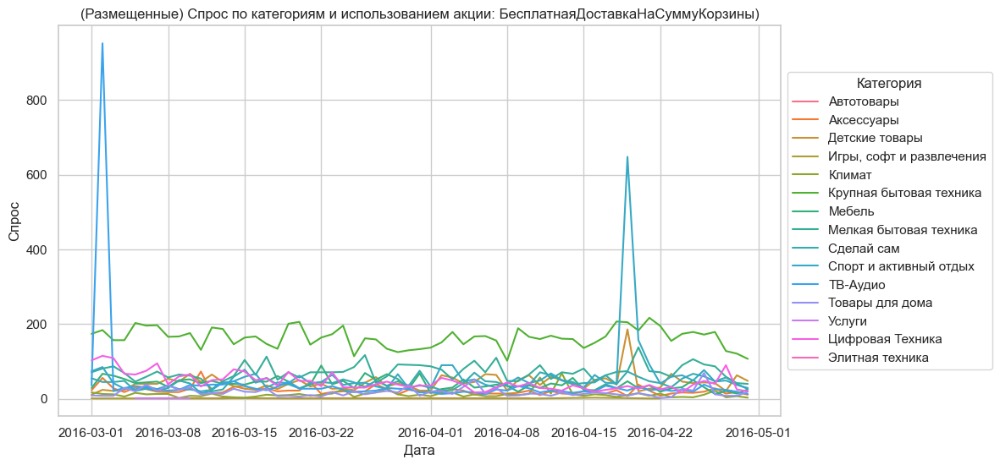

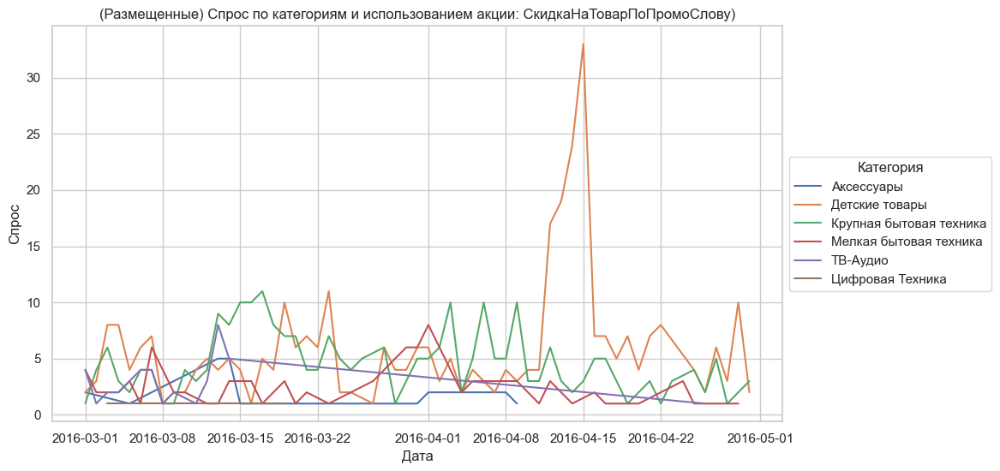

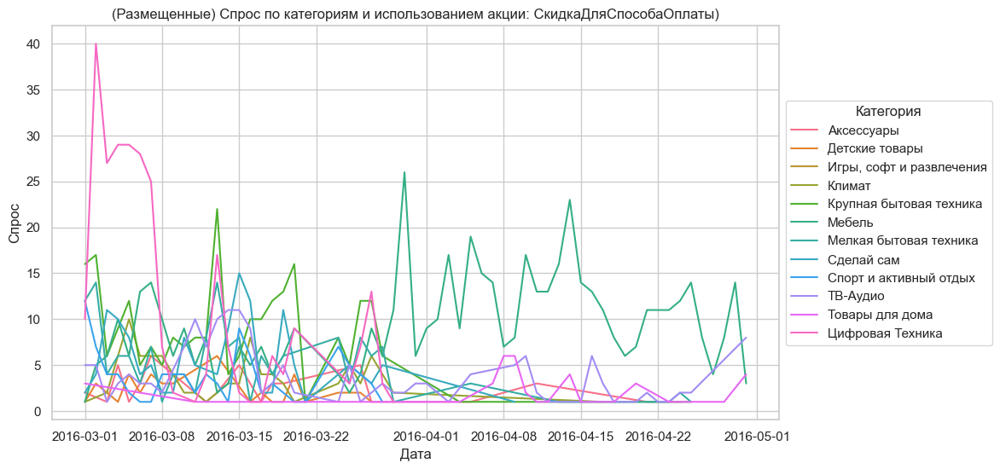

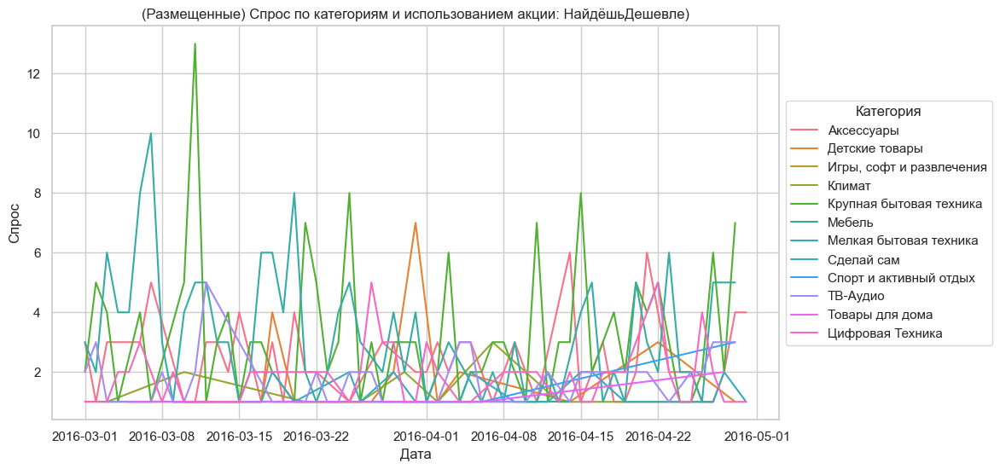

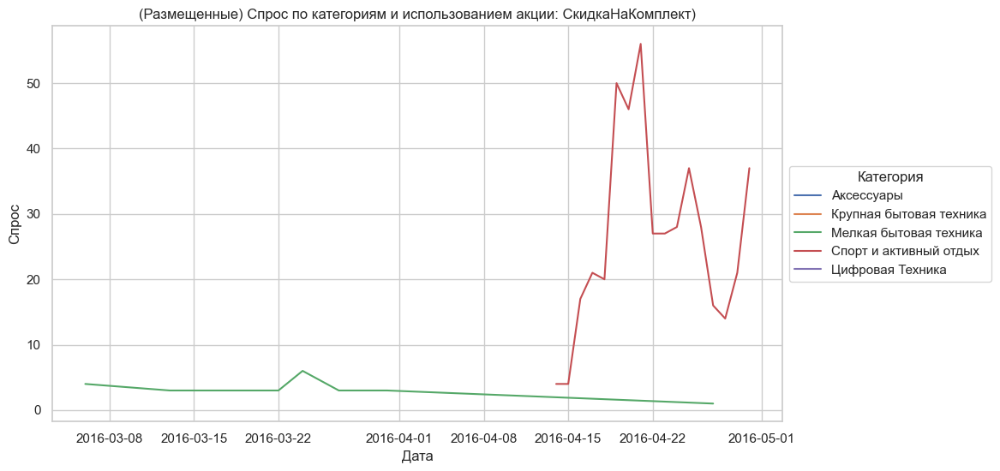

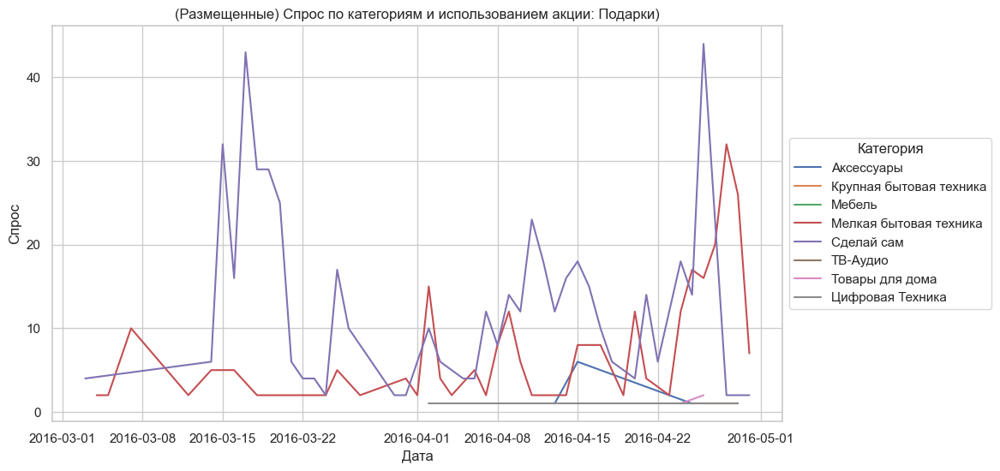

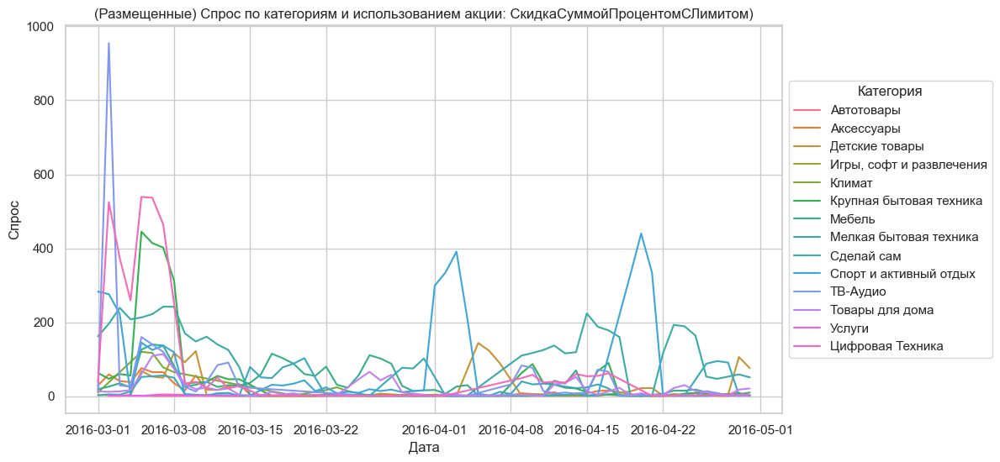

In [ ]:
# Спрос размещенные по каждой акции

action_list = list(actions_set)

for action in action_list:
    stat = df1[df1[action] == 1]
    grouped = stat[['TN', 'OrderDate', 'Quant']].groupby(['TN', 'OrderDate']).sum().reset_index()

    plt.figure(figsize=(11, 6))
    sns.lineplot(data=grouped , x='OrderDate', y='Quant', hue='TN')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Категория")
    plt.title(f'(Размещенные) Спрос по категориям и использованием акции: {action})')
    plt.ylabel('Спрос')
    plt.xlabel('Дата')

/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/521182536.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  stat = df1[df1['Status_ID'] == 14][df1[action] == 1]
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/521182536.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  stat = df1[df1['Status_ID'] == 14][df1[action] == 1]
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/521182536.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  stat = df1[df1['Status_ID'] == 14][df1[action] == 1]
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/521182536.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  stat = df1[df1['Status_ID'] == 14][df1[action] == 1]
/var/folders/bh/d932d5zj56z9_y_7lh3s66ndf1n4c9/T/ipykernel_64688/521182536.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame in

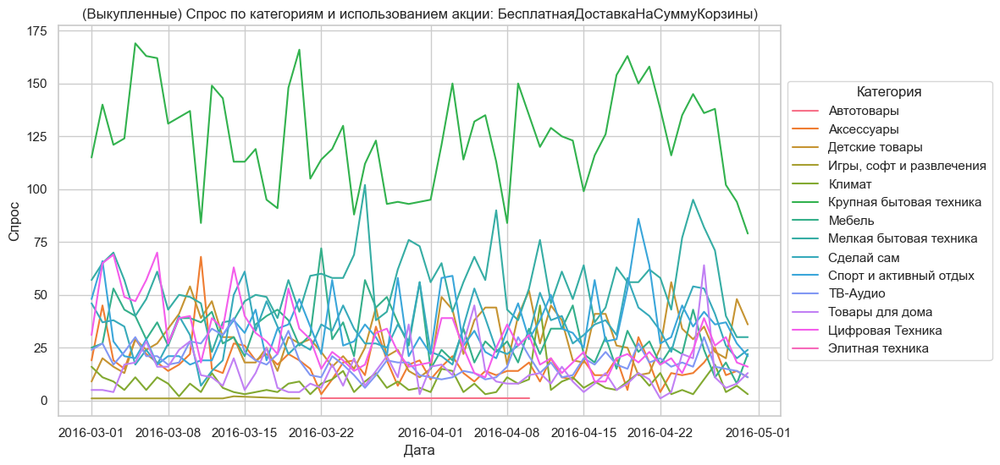

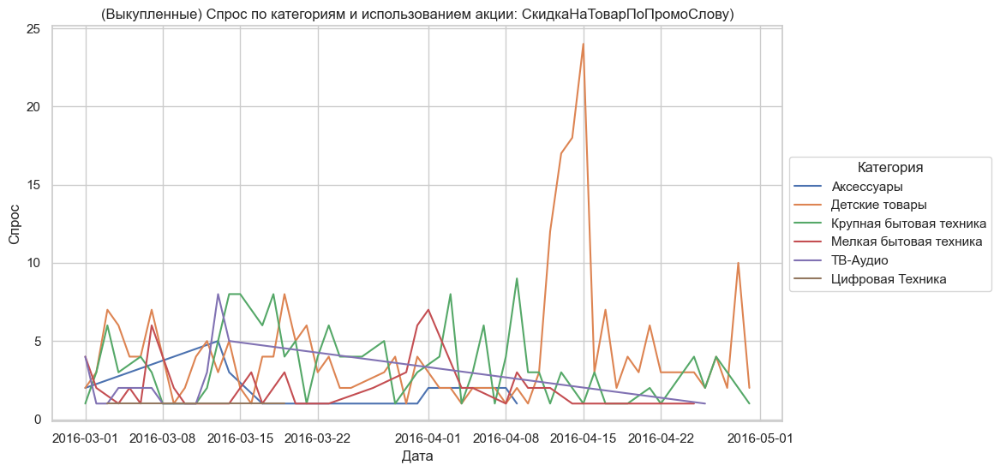

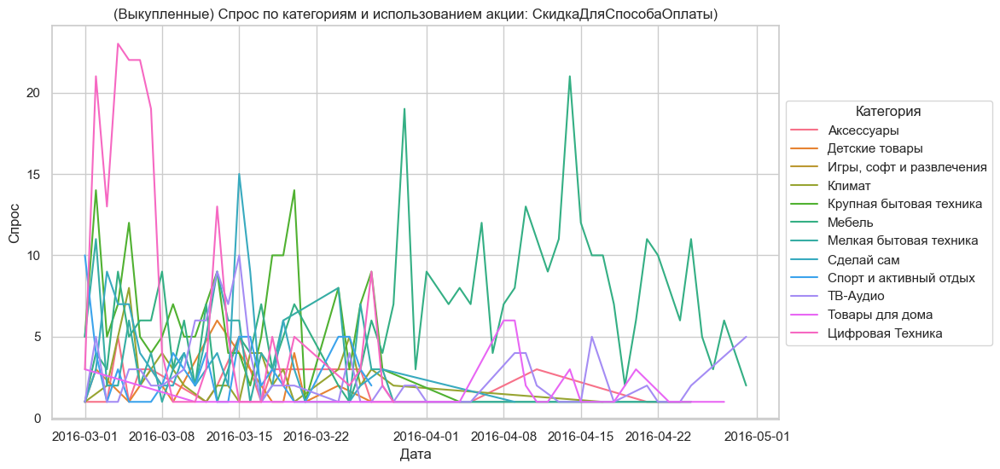

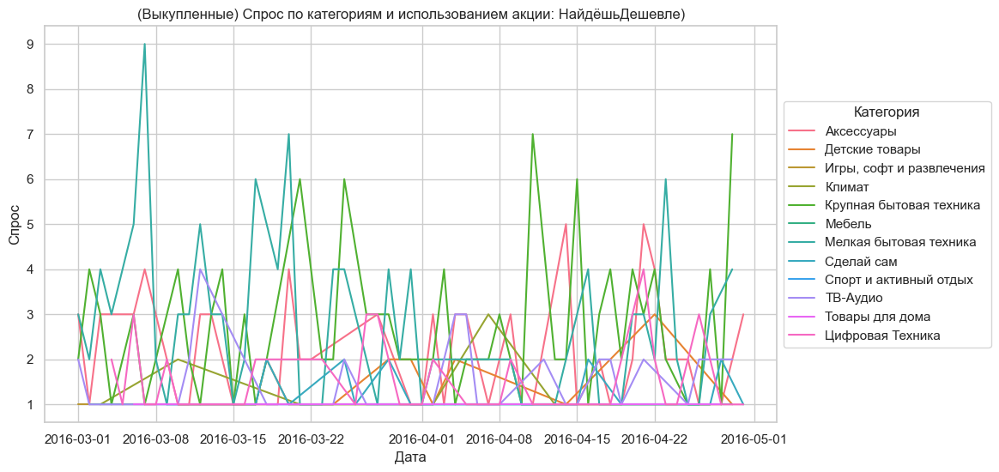

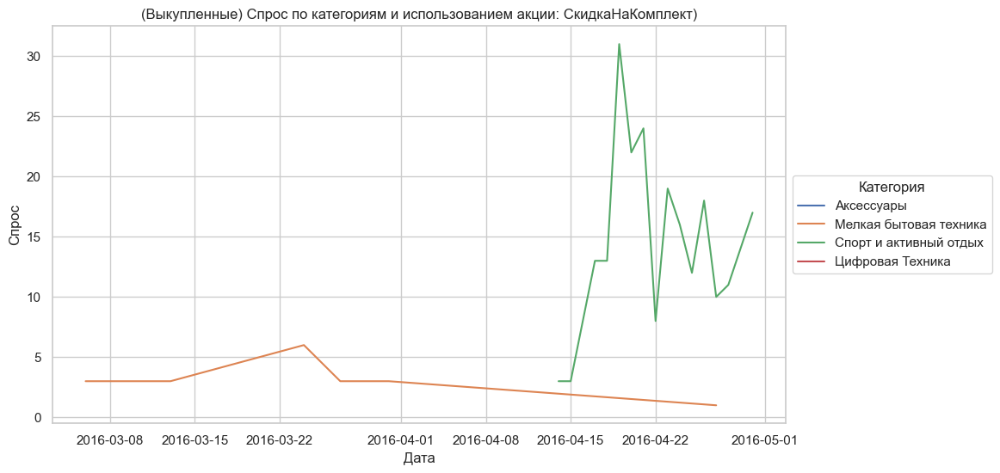

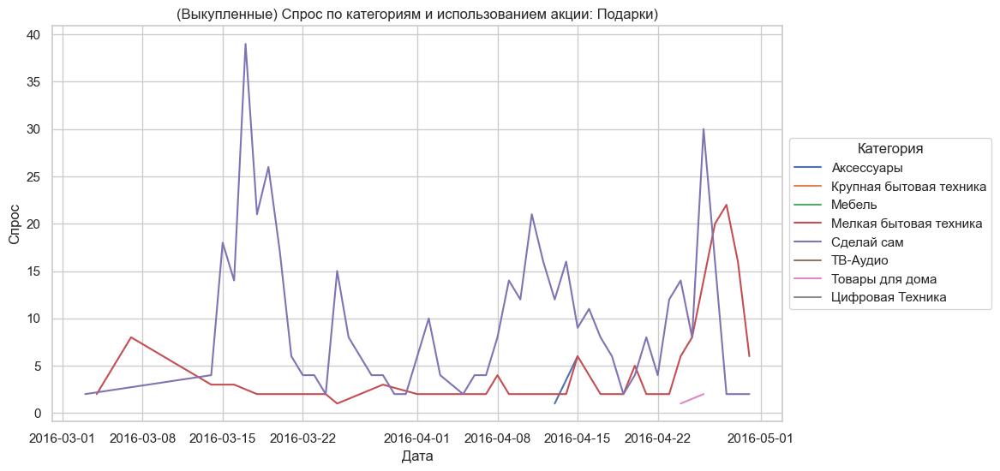

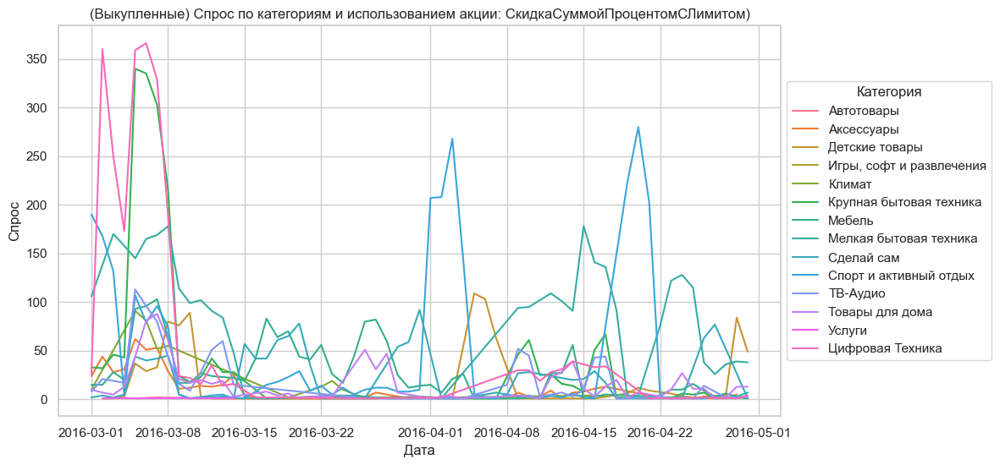

In [38]:
# Спрос выкупленные по каждой акции

action_list = list(actions_set)

for action in action_list:
    stat = df1[df1['Status_ID'] == 14][df1[action] == 1]
    grouped = stat[['TN', 'OrderDate', 'Quant']].groupby(['TN', 'OrderDate']).sum().reset_index()

    plt.figure(figsize=(11, 6))
    sns.lineplot(data=grouped , x='OrderDate', y='Quant', hue='TN')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Категория")
    plt.title(f'(Выкупленные) Спрос по категориям и использованием акции: {action})')
    plt.ylabel('Спрос')
    plt.xlabel('Дата')